# Setting up fastai and google drive

In [ ]:
  !curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [ ]:
!pip install "torch==1.4" "torchvision==0.5.0"

     |████████████████████████████████| 753.4MB 24kB/s 
     |████████████████████████████████| 4.0MB 18.6MB/s 
  Found existing installation: torch 1.5.1+cu101
    Uninstalling torch-1.5.1+cu101:
      Successfully uninstalled torch-1.5.1+cu101
  Found existing installation: torchvision 0.6.1+cu101
    Uninstalling torchvision-0.6.1+cu101:
      Successfully uninstalled torchvision-0.6.1+cu101


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!ls "/content/drive/My Drive/shopee-product-detection-dataset/train/train"

00  03	06  09	12  15	18  21	24  27	30  33	36  39
01  04	07  10	13  16	19  22	25  28	31  34	37  40
02  05	08  11	14  17	20  23	26  29	32  35	38  41


In [ ]:
from fastai.vision import *

# Process images

In [ ]:
path = Path("/content/drive/My Drive/shopee-product-detection-dataset/train/train")

In [ ]:
testPath = Path("/content/drive/My Drive/shopee-product-detection-dataset/test/test/")

In [ ]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2, 
      ds_tfms=get_transforms(), size=224, num_workers=4, seed=2).normalize(imagenet_stats)

In [ ]:
data.classes

In [ ]:
data.show_batch(rows=3, figsize=(7,8))

In [ ]:
data.c

42

In [ ]:
len(data.train_ds), len(data.valid_ds)

(82840, 20709)

# Running CNN leaner

In [ ]:
learn = cnn_learner(data, models.resnet34, metrics=[accuracy, error_rate])

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [ ]:
learn.lr_find()

epoch,train_loss,valid_loss,accuracy,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


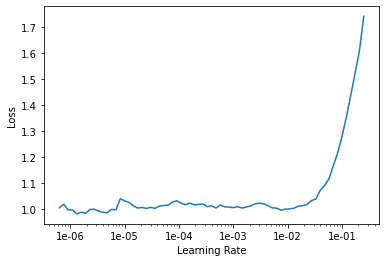

In [ ]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.417213,1.165290,0.682702,0.317298,3:31:58
1,1.183001,1.006140,0.725116,0.274884,2:25:19
2,1.101254,0.961283,0.741294,0.258706,2:24:22


In [ ]:
pthLoc = Path("/content/drive/My Drive/shopee-stage-1-cleaned2")
learn.save(file=pthLoc)

In [ ]:
pthLearn = Path("/content/drive/My Drive/")
# learn.export(file=pthLearn)

In [ ]:
pthLearn = Path("/content/drive/My Drive/")
# learn.export(file=pthLearn)

In [ ]:
learn.load(file=Path("/content/drive/My Drive/tmp"), )

In [ ]:
learn = load_learner(path=pthLearn, file="export3.pkl")

In [ ]:
learn.data = data

In [ ]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.250551,1.036894,0.704336,0.295664,3:39:34
1,1.116627,0.918920,0.740962,0.259038,2:30:50
2,0.989617,0.863751,0.756239,0.243761,2:34:12


In [ ]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.371283,1.063180,0.700161,0.299839,3:34:28
1,1.106373,0.910565,0.745706,0.254294,2:22:40
2,0.983101,0.870772,0.757282,0.242718,2:33:32


In [ ]:
# Do not forget to import the callback function
from fastai.callbacks import SaveModelCallback
# Train with the callback function set to save weights every epoch
learn.fit_one_cycle(20, 
       callbacks=[SaveModelCallback(learn, every='epoch',  
                  monitor='accuracy', name='saved_net')])

# Use start_epoch=<some_epoch> to resume training...
learn.fit_one_cycle(20, max_lr=slice(1e-5,1e-6), 
                    start_epoch=<next_epoch#>,
                    callbacks=[SaveModelCallback(learn, 
                    every='epoch', monitor='accuracy', 
                    name=<callback_save_file>)])

In [ ]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,accuracy,error_rate,time
0,1.197552,1.072624,0.695085,0.304915,7:43:39


In [ ]:
pthLearn = Path("/content/drive/My Drive/export4.pkl")
learn.export(file=pthLearn)

# Fine tuning

In [ ]:
learn.unfreeze()

epoch,train_loss,valid_loss,accuracy,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


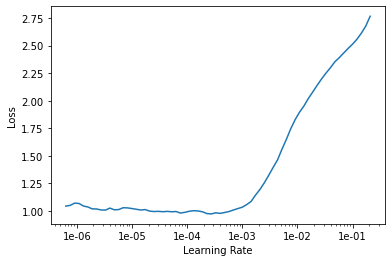

In [ ]:
learn.lr_find()
learn.recorder.plot()

In [ ]:
learn.summary

In [ ]:
learn.fit_one_cycle(2, max_lr=1e-4)

epoch,train_loss,valid_loss,accuracy,error_rate,time


OSError: ignored

In [ ]:
pthLearn = Path("/content/drive/My Drive/export3.pkl")
learn.export(file=pthLearn)

# Analyze data

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)

In [ ]:
help(interp.most_confused)

Help on method most_confused in module fastai.train:

most_confused(min_val:int=1, slice_size:int=1) -> Collection[Tuple[str, str, int]] method of fastai.train.ClassificationInterpretation instance
    Sorted descending list of largest non-diagonal entries of confusion matrix, presented as actual, predicted, number of occurrences.



In [ ]:
interp.top_losses()

torch.return_types.topk(values=tensor([1.4537e+01, 1.2962e+01, 1.1794e+01,  ..., 2.5034e-06, 1.7881e-06,
        1.7881e-06]), indices=tensor([14415,  4394, 10970,  ...,  3177, 18936,  8024]))

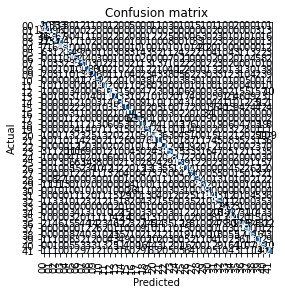

In [ ]:
interp.plot_confusion_matrix()

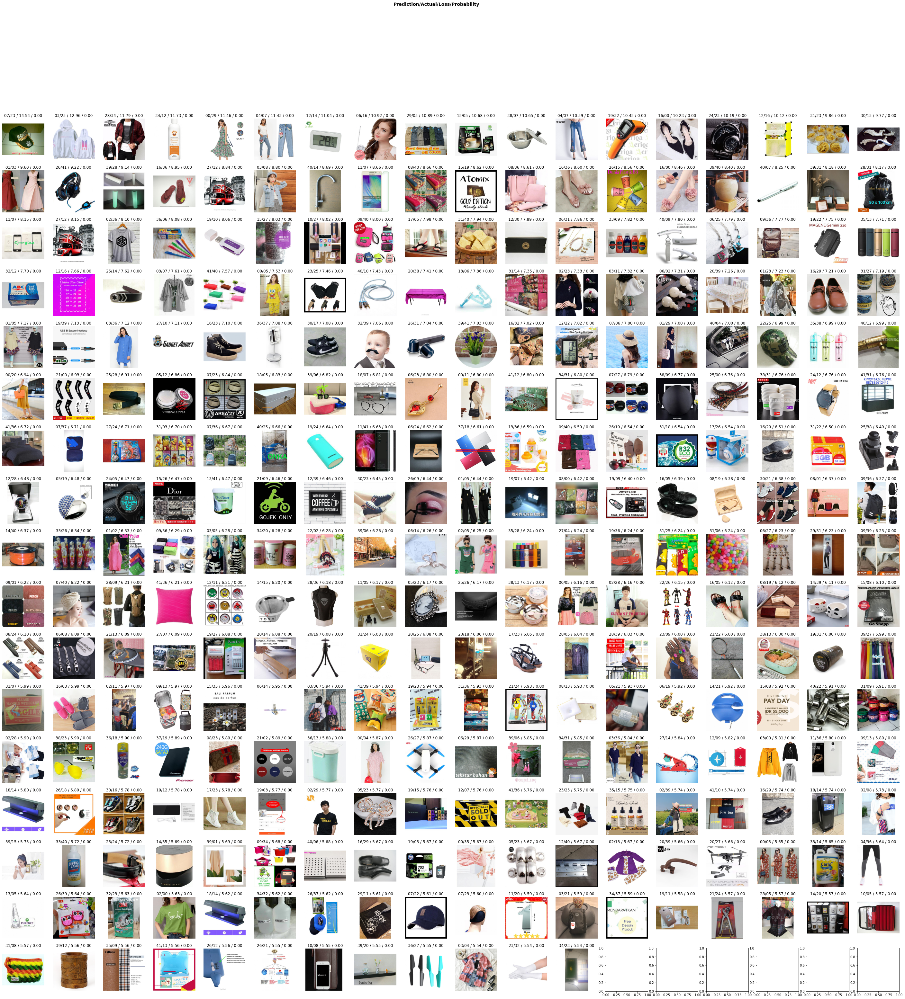

In [ ]:
interp.plot_top_losses(300, figsize=(50, 50))

In [ ]:
losses,idxs = interp.top_losses()

In [ ]:
len(idxs)

21078

In [ ]:
losses[1500]

tensor(3.0906)

In [ ]:
losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

incorrectFiles = []
for p in data.valid_ds.x.items[idxs]:
  incorrectFiles.append(p)

In [ ]:
len(incorrectFiles)

21078

In [ ]:
indexes = idxs.numpy()

In [ ]:
df = pd.DataFrame({'filename':incorrectFiles, 'index':indexes}, columns=['filename', 'index'])

In [ ]:
df.to_csv("/content/drive/My Drive/wrongdata3.csv", index=False)

In [ ]:
sum_img = open_image(fn=Path("/content/drive/My Drive/shopee-product-detection-dataset/test/test/0a1b08117fdda24f50eaa071243c135e.jpg"))

In [ ]:
ans = learn.predict(sum_img)
cat = ans[1].numpy().item()
cat
if (cat < 10) :
    newcat = f"0{str(cat)}"
newcat
cat

31

In [ ]:
len(incorrectFiles[:300])

300

## Run this block to move losers to correct data locations

In [ ]:
value = 1
for eachImage in incorrectFiles[:1500]:
  print(f'Working on picture {value} now')
  the_img = open_image(fn=eachImage)
  actual_cat = learn.predict(the_img)
  cat = actual_cat[1].numpy().item()

  # get category as strings
  newcat = 0
  if (cat < 10):
      newcat = f"0{str(cat)}"
  else:
    newcat = str(cat)
  value = value+1
  shutil.move(eachImage, f'/content/drive/My Drive/shopee-product-detection-dataset/train/train/{newcat}/{eachImage.name}')

Working on picture 1 now
Working on picture 2 now
Working on picture 3 now
Working on picture 4 now
Working on picture 5 now
Working on picture 6 now
Working on picture 7 now
Working on picture 8 now
Working on picture 9 now
Working on picture 10 now
Working on picture 11 now
Working on picture 12 now
Working on picture 13 now
Working on picture 14 now
Working on picture 15 now
Working on picture 16 now
Working on picture 17 now
Working on picture 18 now
Working on picture 19 now
Working on picture 20 now
Working on picture 21 now
Working on picture 22 now
Working on picture 23 now
Working on picture 24 now
Working on picture 25 now
Working on picture 26 now
Working on picture 27 now
Working on picture 28 now
Working on picture 29 now
Working on picture 30 now
Working on picture 31 now
Working on picture 32 now
Working on picture 33 now
Working on picture 34 now
Working on picture 35 now
Working on picture 36 now
Working on picture 37 now
Working on picture 38 now
Working on picture 39

# Run on test data

In [ ]:
testcsv = pd.read_csv("/content/drive/My Drive/shopee-product-detection-dataset/test.csv");
testcsv

,filename,category
0,fd663cf2b6e1d7b02938c6aaae0a32d2.jpg,43
1,c7fd77508a8c355eaab0d4e10efd6b15.jpg,43
2,127f3e6d6e3491b2459812353f33a913.jpg,43
3,5ca4f2da11eda083064e6c36f37eeb81.jpg,43
4,46d681a542f2c71be017eef6aae23313.jpg,43
...,...,...
12181,5ba958eacb23cd7d1673bad4dae55784.jpg,43
12182,efbe41a1c2b666b70e337e438559808b.jpg,43
12183,79fdaa5ac5ba10dbe8004cabd8c35eb3.jpg,43
12184,ac3d136124617637a05ba66694e381ef.jpg,43


In [ ]:
testPath = "/content/drive/My Drive/shopee-product-detection-dataset/test/test/"
pathnames = []
for index, row in testcsv.iterrows():
  pathnames.append(Path(testPath + row["filename"]))

pathnames

[PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/fd663cf2b6e1d7b02938c6aaae0a32d2.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/c7fd77508a8c355eaab0d4e10efd6b15.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/127f3e6d6e3491b2459812353f33a913.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/5ca4f2da11eda083064e6c36f37eeb81.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/46d681a542f2c71be017eef6aae23313.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/f27ffaf1ab259a0efe2c59611de6732b.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/5eb8d9688d86ec7277f10fc18f386913.jpg'),
 PosixPath('/content/drive/My Drive/shopee-product-detection-dataset/test/test/2ff578b587ec0c086ded573a3a9a9e3a.jpg'),
 PosixPath('/content/drive/My Drive/shopee-produ

In [ ]:
test_imgs = (testPath).ls()


In [ ]:
data.add_test(pathnames)
learn.data = data
preds = learn.get_preds(ds_type=DatasetType.Test)

In [ ]:
y = torch.argmax(preds[0], dim=1)

In [ ]:
labelled_preds = [category for category in y.numpy()] ; labelled_preds

[20,
 27,
 4,
 22,
 12,
 40,
 4,
 39,
 33,
 33,
 15,
 14,
 13,
 29,
 5,
 4,
 29,
 24,
 9,
 37,
 6,
 15,
 1,
 4,
 1,
 8,
 10,
 38,
 12,
 37,
 27,
 37,
 5,
 8,
 24,
 38,
 13,
 41,
 17,
 10,
 25,
 7,
 15,
 17,
 18,
 9,
 11,
 21,
 28,
 41,
 29,
 13,
 14,
 29,
 9,
 4,
 41,
 41,
 39,
 0,
 21,
 29,
 35,
 15,
 8,
 12,
 35,
 36,
 12,
 20,
 33,
 18,
 26,
 12,
 28,
 34,
 17,
 22,
 4,
 10,
 36,
 39,
 26,
 22,
 6,
 3,
 27,
 27,
 26,
 10,
 9,
 39,
 0,
 13,
 38,
 39,
 36,
 3,
 7,
 18,
 34,
 6,
 6,
 38,
 15,
 7,
 34,
 26,
 18,
 31,
 30,
 18,
 23,
 4,
 12,
 24,
 15,
 39,
 28,
 26,
 20,
 4,
 41,
 33,
 27,
 9,
 29,
 0,
 5,
 40,
 32,
 34,
 28,
 35,
 39,
 26,
 10,
 3,
 32,
 32,
 4,
 39,
 11,
 32,
 30,
 7,
 9,
 7,
 10,
 12,
 6,
 23,
 17,
 5,
 0,
 37,
 34,
 41,
 12,
 6,
 17,
 41,
 1,
 34,
 24,
 31,
 0,
 40,
 25,
 35,
 31,
 31,
 1,
 16,
 27,
 26,
 23,
 41,
 8,
 33,
 39,
 12,
 40,
 33,
 16,
 26,
 4,
 18,
 0,
 25,
 18,
 14,
 16,
 14,
 27,
 3,
 0,
 32,
 38,
 23,
 22,
 13,
 13,
 30,
 29,
 14,
 16,
 26,
 39,
 10,


In [ ]:
fnames = [f.name for f in learn.data.test_ds.items]

In [ ]:
df = pd.DataFrame({'filename':fnames, 'category':labelled_preds}, columns=['filename', 'category'])

In [ ]:
df.to_csv("/content/drive/My Drive/submission4.csv", index=False)